# Drone Detector

An approach to detect a drone from pictures using Tensorflow Object detection API. Final project for Data Science bootcamp organized by Sages.

## Table of contents

1. Abstract

2. About dataset

3. Installation and Setup of Tensorflow Object Detection API

4. Prerequisites

5. Data preprocessing

6. Training Configuration

7. Model Training

8. Model Export for Inference

9. Detection

10. References


## 1. Abstract

The goal of the project is to detect the drone from a photo taken by the user. The main idea is to use already available keras model architectures (https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md) and configure it in a way to tackle a desired task

## 2. About dataset

[Drone Dataset](https://www.kaggle.com/dasmehdixtr/drone-dataset-uav) dataset of UAV objects collected by Mehdi Özel for a UAV Competition which contains 1359 photos of drones. Some of them were removed from the dataset because the extensions of image files in the already prepared xml files were not corresponding to the real image extensions.

## 3. Installation and Setup of Tensorflow Object Detection API

Definition of a new virtual environment

In [40]:
pip install --upgrade virtualenv 

Note: you may need to restart the kernel to use updated packages.


In [41]:
!python -m virtualenv tf2_apienv

created virtual environment CPython3.8.8.final.0-64 in 4361ms
  creator CPython3Posix(dest=/Users/hubertradom/project/models/research/tf2_apienv, clear=False, no_vcs_ignore=False, global=False)
  seeder FromAppData(download=False, pip=bundle, setuptools=bundle, wheel=bundle, via=copy, app_data_dir=/Users/hubertradom/Library/Application Support/virtualenv)
    added seed packages: pip==21.2.3, setuptools==57.4.0, wheel==0.37.0
  activators BashActivator,CShellActivator,FishActivator,PowerShellActivator,PythonActivator


In [43]:
!source tf2_apienv/bin/activate

Installation of necessary tensorflow libraries

In [44]:
!pip install -U --pre tensorflow=="2.*"
!pip install tf_slim

In [45]:
#!pip install pycocotools

Download and extract of a TensorFlow Model Garden which is an official TensorFlow repository on github.com

In [46]:
import os
import pathlib


if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Download, installation and compilation of the latest protobuf version from (https://github.com/protocolbuffers/protobuf/releases). By default, the TensorFlow Object Detection API uses Protobuf to configure model and training parameters, so we need this library to move on.

Extraction of proto content to the project directory

In [54]:
os.chdir('/users/hubertradom/project')
!protoc/bin/protoc models/research/object_detection/protos/*.proto --python_out=.

object_detection/protos/flexible_grid_anchor_generator.proto: File not found.
object_detection/protos/grid_anchor_generator.proto: File not found.
object_detection/protos/multiscale_anchor_generator.proto: File not found.
object_detection/protos/ssd_anchor_generator.proto: File not found.
models/research/object_detection/protos/anchor_generator.proto:5:1: Import "object_detection/protos/flexible_grid_anchor_generator.proto" was not found or had errors.
models/research/object_detection/protos/anchor_generator.proto:6:1: Import "object_detection/protos/grid_anchor_generator.proto" was not found or had errors.
models/research/object_detection/protos/anchor_generator.proto:7:1: Import "object_detection/protos/multiscale_anchor_generator.proto" was not found or had errors.
models/research/object_detection/protos/anchor_generator.proto:8:1: Import "object_detection/protos/ssd_anchor_generator.proto" was not found or had errors.
models/research/object_detection/protos/anchor_generator.proto:1

Installation of COCO API that introduces a set of popular detection or/and segmentation metrics used for model evaluation

In [55]:
!pip install cython
!git clone https://github.com/cocodataset/cocoapi.git



In [60]:
os.chdir('/users/hubertradom/project/cocoapi/PythonAPI')
!make


python setup.py build_ext --inplace
running build_ext
skipping 'pycocotools/_mask.c' Cython extension (up-to-date)
building 'pycocotools._mask' extension
creating build
creating build/common
creating build/temp.macosx-10.9-x86_64-3.8
creating build/temp.macosx-10.9-x86_64-3.8/pycocotools
gcc -Wno-unused-result -Wsign-compare -Wunreachable-code -DNDEBUG -g -fwrapv -O3 -Wall -Wstrict-prototypes -I/opt/anaconda3/include -arch x86_64 -I/opt/anaconda3/include -arch x86_64 -I/opt/anaconda3/lib/python3.8/site-packages/numpy/core/include -I../common -I/opt/anaconda3/include/python3.8 -c ../common/maskApi.c -o build/temp.macosx-10.9-x86_64-3.8/../common/maskApi.o -Wno-cpp -Wno-unused-function -std=c99
gcc -Wno-unused-result -Wsign-compare -Wunreachable-code -DNDEBUG -g -fwrapv -O3 -Wall -Wstrict-prototypes -I/opt/anaconda3/include -arch x86_64 -I/opt/anaconda3/include -arch x86_64 -I/opt/anaconda3/lib/python3.8/site-packages/numpy/core/include -I../common -I/opt/anaconda3/include/python3.8 -c p

In [61]:
!cp -r pycocotools /users/hubertradom/project/models/research/


Installation of the Object Detection API

In [66]:
os.chdir('/users/hubertradom/project/models/research')
!cp object_detection/packages/tf2/setup.py .


In [70]:
!python -m pip install .


Processing /Users/hubertradom/project/models/research
  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.


  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1661861 sha256=0b6c1b9dd50e3839f5e55184b499103114b5bd77f61d368ffcf36ae1733d00a1
  Stored in directory: /private/var/folders/zm/k4mg_1hj77g3d2zt8q9598740000gp/T/pip-ephem-wheel-cache-4r9rj0_i/wheels/f3/53/e2/42e4ef8dc524dbd615222327f95091002c60038adb9f0cae39
Successfully built object-detection
  Attempting uninstall: object-detection
    Found existing installation: object-detection 0.1
    Uninstalling object-detection-0.1:
      Successfully uninstalled object-detection-0.1


Test of installation if successfull

In [72]:
!python object_detection/builders/model_builder_tf2_test.py

Running tests under Python 3.8.8: /opt/anaconda3/bin/python
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2021-08-26 00:10:06.599026: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
/opt/anaconda3/lib/python3.8/site-packages/object_detection/builders/model_builder.py:1088: DeprecationWarning: The 'warn' function is deprecated, use 'warning' instead
  logging.warn(('Building experimental DeepMAC meta-arch.'
W0826 00:10:08.518378 4570021376 model_builder.py:1088] Building experimental DeepMAC meta-arch. Some features may be omitted.
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 4.22s
I0826 00:10:10.781479 4570021376 test_util.py:2188] time(__main__.ModelBuilderTF2Test.test

I0826 00:10:47.540307 4570021376 efficientnet_model.py:147] round_filter input=16 output=16
I0826 00:10:47.540698 4570021376 efficientnet_model.py:147] round_filter input=24 output=24
I0826 00:10:48.924278 4570021376 efficientnet_model.py:147] round_filter input=24 output=24
I0826 00:10:48.924669 4570021376 efficientnet_model.py:147] round_filter input=40 output=40
I0826 00:10:50.383069 4570021376 efficientnet_model.py:147] round_filter input=40 output=40
I0826 00:10:50.384150 4570021376 efficientnet_model.py:147] round_filter input=80 output=80
I0826 00:10:52.550546 4570021376 efficientnet_model.py:147] round_filter input=80 output=80
I0826 00:10:52.550906 4570021376 efficientnet_model.py:147] round_filter input=112 output=112
I0826 00:10:55.222573 4570021376 efficientnet_model.py:147] round_filter input=112 output=112
I0826 00:10:55.222936 4570021376 efficientnet_model.py:147] round_filter input=192 output=192
I0826 00:10:58.443500 4570021376 efficientnet_model.py:147] round_filter i

I0826 00:11:34.862283 4570021376 efficientnet_model.py:147] round_filter input=192 output=208
I0826 00:11:34.863363 4570021376 efficientnet_model.py:147] round_filter input=320 output=352
I0826 00:11:36.330558 4570021376 efficientnet_model.py:147] round_filter input=1280 output=1408
I0826 00:11:36.660689 4570021376 efficientnet_model.py:458] Building model efficientnet with params ModelConfig(width_coefficient=1.1, depth_coefficient=1.2, resolution=260, dropout_rate=0.3, blocks=(BlockConfig(input_filters=32, output_filters=16, kernel_size=3, num_repeat=1, expand_ratio=1, strides=(1, 1), se_ratio=0.25, id_skip=True, fused_conv=False, conv_type='depthwise'), BlockConfig(input_filters=16, output_filters=24, kernel_size=3, num_repeat=2, expand_ratio=6, strides=(2, 2), se_ratio=0.25, id_skip=True, fused_conv=False, conv_type='depthwise'), BlockConfig(input_filters=24, output_filters=40, kernel_size=5, num_repeat=2, expand_ratio=6, strides=(2, 2), se_ratio=0.25, id_skip=True, fused_conv=Fals

I0826 00:12:14.963804 4570021376 ssd_efficientnet_bifpn_feature_extractor.py:142] EfficientDet EfficientNet backbone version: efficientnet-b5
I0826 00:12:14.964127 4570021376 ssd_efficientnet_bifpn_feature_extractor.py:144] EfficientDet BiFPN num filters: 288
I0826 00:12:14.964321 4570021376 ssd_efficientnet_bifpn_feature_extractor.py:145] EfficientDet BiFPN num iterations: 7
I0826 00:12:14.971735 4570021376 efficientnet_model.py:147] round_filter input=32 output=48
I0826 00:12:15.037634 4570021376 efficientnet_model.py:147] round_filter input=32 output=48
I0826 00:12:15.037944 4570021376 efficientnet_model.py:147] round_filter input=16 output=24
I0826 00:12:15.848031 4570021376 efficientnet_model.py:147] round_filter input=16 output=24
I0826 00:12:15.848464 4570021376 efficientnet_model.py:147] round_filter input=24 output=40
I0826 00:12:18.333252 4570021376 efficientnet_model.py:147] round_filter input=24 output=40
I0826 00:12:18.333572 4570021376 efficientnet_model.py:147] round_fil

I0826 00:13:10.754146 4570021376 efficientnet_model.py:147] round_filter input=24 output=48
I0826 00:13:10.754387 4570021376 efficientnet_model.py:147] round_filter input=40 output=80
I0826 00:13:13.918684 4570021376 efficientnet_model.py:147] round_filter input=40 output=80
I0826 00:13:13.919000 4570021376 efficientnet_model.py:147] round_filter input=80 output=160
I0826 00:13:19.563335 4570021376 efficientnet_model.py:147] round_filter input=80 output=160
I0826 00:13:19.563744 4570021376 efficientnet_model.py:147] round_filter input=112 output=224
I0826 00:13:24.075176 4570021376 efficientnet_model.py:147] round_filter input=112 output=224
I0826 00:13:24.122334 4570021376 efficientnet_model.py:147] round_filter input=192 output=384
I0826 00:13:32.408395 4570021376 efficientnet_model.py:147] round_filter input=192 output=384
I0826 00:13:32.417891 4570021376 efficientnet_model.py:147] round_filter input=320 output=640
I0826 00:13:35.574234 4570021376 efficientnet_model.py:147] round_fi

## 4. Prerequisites 

In [73]:
import io
import os
import scipy.misc
import numpy as np
import six
import time
import glob
from IPython.display import display

from six import BytesIO

import matplotlib
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

import tensorflow as tf

%matplotlib inline
!brew install wget

Import of the object detection module.

In [74]:
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

## 5. Data preprocessing

Downloaded drone dataset contains already labels for all the pictures in XML format. The data are manually splitted between train and test dataset to keep the propotion 90% to 10%

Definition of test and train folders directory

In [77]:
train_dir='/Users/hubertradom/project/workspace/images/train'
test_dir='/Users/hubertradom/project/workspace/images/test'

Calculation of the number of pictures

In [88]:
def n_data(directory):
    n=0
    for root,folders,files in os.walk(directory):
        for file in files:
            n+=1
        return int(n/2)
    

In [92]:
n_train_data=n_data(train_dir)
n_test_data=n_data(test_dir)
print(f'number of train pictures: {n_train_data}\nnumber of test pictures: {n_test_data}')

number of train pictures: 918
number of test pictures: 93


Object Detection API needs data in TFRecord format which is a simple format storing a sequence of binary records. Using binary file format have a significant impact on the performance of pipeline import and as consequence on the training time of a model. Additionally it takes less space on disk, less time to copy and can be read more efficiently from the disk. Definition of TFRecord format will be done in two steps:

1. Labels will be converted from xml to csv
2. TFRecords will be created using csv files and corresponding images

Both operations are performed with python scripts attached to the project folder

In [110]:
os.chdir('/users/hubertradom/project/workspace')

In [97]:
!python xml_to_csv.py

Successfully converted xml to csv.


In [104]:
!python generate_tfrecord.py --csv_input=annotations/train_labels.csv --image_dir=images/train --output_path=annotations/train.record --class_name='drone'
!python generate_tfrecord.py --csv_input=annotations/test_labels.csv --image_dir=images/test --output_path=annotations/test.record --class_name='drone'

Successfully created the TFRecords: /Users/hubertradom/project/workspace/annotations/train.record
Successfully created the TFRecords: /Users/hubertradom/project/workspace/annotations/test.record


There is a possibility to check the record files, if everything was created properly. For this view_records.py script is used ('n' allows to move to the next picture, 'esc' quits the viewer)

In [105]:
!python view_records_tf2.py


2021-08-26 00:58:56.221396: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2021-08-26 00:58:56.389991: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)

Going through 93 records with a stride of 1.
Enter 'n' to bring up next image in record.


Image 0
    b'pic_120.jpg'
    Height/width: (310, 620)
    Num bboxes: 3

Image 1
    b'pic_121.jpg'
    Height/width: (538, 510)
    Num bboxes: 1

Image 2
    b'pic_122.jpg'
    Height/width: (995, 850)
    Num bboxes: 1


tfrecord-view: done going throug the data.


Definition of labelmap file needed for training and detection purposes

In [346]:
from object_detection.protos.string_int_label_map_pb2 import StringIntLabelMap, StringIntLabelMapItem
from google.protobuf import text_format


def convert_classes(classes, start=1):
    msg = StringIntLabelMap()
    for id, name in enumerate(classes, start=start):
        msg.item.append(StringIntLabelMapItem(id=id, name=name))

    text = str(text_format.MessageToBytes(msg, as_utf8=True), 'utf-8')
    return text


if __name__ == '__main__':
    txt = convert_classes(['drone'])
    print(txt)
    with open('/users/hubertradom/project/workspace/annotations/label_map.pbtxt', 'w') as f:
        f.write(txt)

item {
  name: "drone"
  id: 1
}



Definition of the created tfrecords and labelmap directories

In [ ]:
train_record_path = 'annotations/train.record'
test_record_path = 'annotations/test.record'
labelmap_path = 'annotations/label_map.pbtxt'

## 6. Training Configuration

Now that the data is ready it's time to create a training configuration. The Object Detection API supports lots of models, each with its own config file. In this notebook I'm making use of SSD Resnet50 V1 FPN 640x640, but it can be replaced with any model available in the [Tensorflow 2 Detection Model Zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md).

Definition of basic parameters being an input to config file. Limitation to 3000 steps assumed due to long computational time.

In [ ]:
batch_size = 16
num_steps = 3000
num_eval_steps = 1000
checkpoint_interval=500

Resnet model download

In [121]:
os.chdir('/users/hubertradom/project/workspace/pre-trained-models')
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz
!tar -xf faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz

--2021-08-26 18:33:27--  http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 172.217.168.80
Connecting to download.tensorflow.org (download.tensorflow.org)|172.217.168.80|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 211996178 (202M) [application/x-tar]
Saving to: ‘faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz’

faster_rcnn_resnet5 100%[===================>] 202,17M  3,13MB/s    in 38s     

2021-08-26 18:34:06 (5,29 MB/s) - ‘faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz’ saved [211996178/211996178]



Definition of the model checkpoint directory which is an input to config file

In [126]:
fine_tune_checkpoint = 'pre-trained-models/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/checkpoint/ckpt-0'

Download and definition of the config file. In this notebook, the following parameters are modified:

1. Paths to created tfrecord files, labelmap and model checkpoint
2. Batch_size, number of classes to detect and number of training steps
3. Data augmentation options

Of course many more parameters can be tuned (like iou_threshold, max_detection_per_class, max_total_detections or evaluation metrics) but for the purpose of this project only parameters defined above are tuned

In [369]:
os.chdir('/users/hubertradom/project/workspace/models')
!wget --no-check-certificate --content-disposition https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.config
init_name='/Users/hubertradom/project/workspace/models/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.config'
new_name='/Users/hubertradom/project/workspace/models/pipeline.config'
os.rename(init_name,new_name)
base_config_path = '/users/hubertradom/project/workspace/models/pipeline.config'

import re

with open(base_config_path) as f:
    config = f.read()

with open('pipeline.config', 'w') as f:
  
  # Set labelmap path
  config = re.sub('label_map_path: ".*?"', 
                 f'label_map_path: "{labelmap_path}"', config)

  # Set fine_tune_checkpoint path
  config = re.sub('fine_tune_checkpoint: ".*?"',
                 f'fine_tune_checkpoint: "{fine_tune_checkpoint}"', config)

  # Set train tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 
                 f'input_path: "{train_record_path}"', config)
  
  # Set test tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 
                  f'input_path: "{test_record_path}"', config)
  
  # Set number of classes.
  config = re.sub('num_classes: [0-9]+',
                  f'num_classes: {1}', config)
  
  # Set batch size
  config = re.sub('batch_size: [0-9]+',
                  f'batch_size: {batch_size}', config)
  
  # Set training steps
  config = re.sub('num_steps: [0-9]+',
                  f'num_steps: {num_steps}', config)
  
  # Set fine-tune checkpoint type to detection
  config = re.sub('fine_tune_checkpoint_type: "classification"', 
                  f'fine_tune_checkpoint_type: "detection"', config)
    
  config = re.sub(f'data_augmentation_options {{\n'\
                  f'    random_horizontal_flip {{\n'\
                  f'    }}\n'\
                  f'  }}',
                  f'data_augmentation_options {{\n'\
                  f'    random_horizontal_flip {{\n'\
                  f'    }}\n'\
                  f'  }}\n'\
                  f'  data_augmentation_options {{\n'\
                  f'    random_image_scale {{\n'\
                  f'      min_scale_ratio: 0.5\n'\
                  f'      max_scale_ratio: 1.5\n'\
                  f'    }}\n'\
                  f'  }}\n'\
                  f'  data_augmentation_options {{\n'\
                  f'    random_crop_image {{\n'\
                  f'      min_object_covered: 0.0\n'\
                  f'      min_aspect_ratio: 0.75\n'\
                  f'      max_aspect_ratio: 3.0\n'\
                  f'      min_area: 0.75\n'\
                  f'      max_area: 1.0\n'\
                  f'      overlap_thresh: 0.0\n'\
                  f'    }}\n'\
                  f'  }}', config)
  f.write(config)

--2021-08-27 00:49:38--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
  Unable to locally verify the issuer's authority.
HTTP request sent, awaiting response... 200 OK
Length: 3559 (3,5K) [text/plain]
Saving to: ‘faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.config’

faster_rcnn_resnet5 100%[===================>]   3,48K  --.-KB/s    in 0s      

2021-08-27 00:49:39 (24,4 MB/s) - ‘faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.config’ saved [3559/3559]



In [370]:
%cat pipeline.config

# Faster R-CNN with Resnet-50 (v1) with 640x640 input resolution
# Trained on COCO, initialized from Imagenet classification checkpoint
#
# Train on TPU-8
#
# Achieves 29.3 mAP on COCO17 Val

model {
  faster_rcnn {
    num_classes: 1
    image_resizer {
      keep_aspect_ratio_resizer {
        min_dimension: 640
        max_dimension: 640
        pad_to_max_dimension: true
      }
    }
    feature_extractor {
      type: 'faster_rcnn_resnet50_keras'
      batch_norm_trainable: true
    }
    first_stage_anchor_generator {
      grid_anchor_generator {
        scales: [0.25, 0.5, 1.0, 2.0]
        aspect_ratios: [0.5, 1.0, 2.0]
        height_stride: 16
        width_stride: 16
      }
    }
    first_stage_box_predictor_conv_hyperparams {
      op: CONV
      regularizer {
        l2_regularizer {
          weight: 0.0
        }
      }
      initializer {
        truncated_normal_initializer {
          stddev: 0.01
        }
      }
    }
    first_stage_nms_score_threshold: 0.0
 

In [371]:
model_dir = 'models'
pipeline_config_path = 'models/pipeline.config'

## 7. Model Training

In [ ]:
os.chdir('/users/hubertradom/project/workspace')
!python model_main_tf2.py \
    --pipeline_config_path={pipeline_config_path} \
    --model_dir={model_dir} \
    --checkpoint_every_n={checkpoint_interval} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

Model Evaluation - coco detection metrics used. Model calculations stopped after 3k steps due to long calculation time. It's difficult to conclude at this point if total loss would drop even more

In [386]:
%load_ext tensorboard
%tensorboard --logdir=models

Reusing TensorBoard on port 6006 (pid 49664), started 14:46:08 ago. (Use '!kill 49664' to kill it.)

## 8. Model Export for Inference


In [414]:
output_directory = 'exported-models'

!python exporter_main_v2.py \
    --trained_checkpoint_dir {model_dir} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_config_path}

2021-08-29 10:30:14.522663: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W0829 10:30:14.641226 4527357440 deprecation.py:611] From /opt/anaconda3/lib/python3.8/site-packages/tensorflow/python/autograph/impl/api.py:463: calling map_fn_v2 (from tensorflow.python.ops.map_fn) with back_prop=False is deprecated and will be removed in a future version.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back


## 9. Detection

## Loader

List of the strings that is used to add a correct label for each box.

In [441]:
category_index = label_map_util.create_category_index_from_labelmap(labelmap_path, use_display_name=True)

Path to the images that will be tested. Tested images are different from the ones used for validation

In [442]:
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('/Users/hubertradom/project/workspace/images/test2')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpeg")))


Load an object detection model:

In [443]:
model=tf.saved_model.load(f'/Users/hubertradom/project/workspace/exported-models/saved_model')

Addition of a wrapper function to call the model, and cleanup the outputs:

In [444]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

In [445]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path (this can be local or on colossus)

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

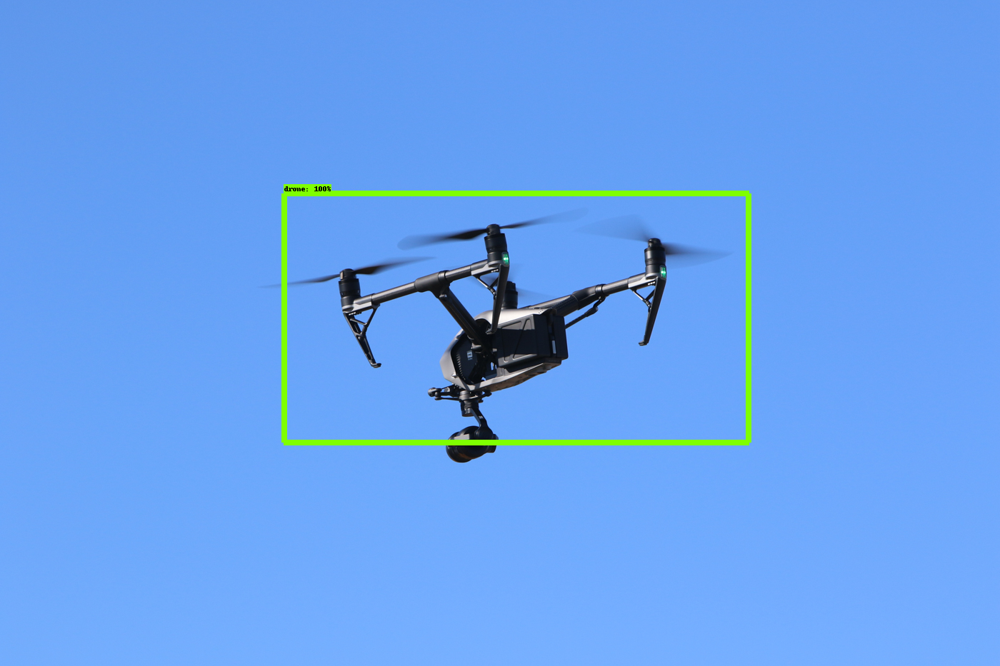

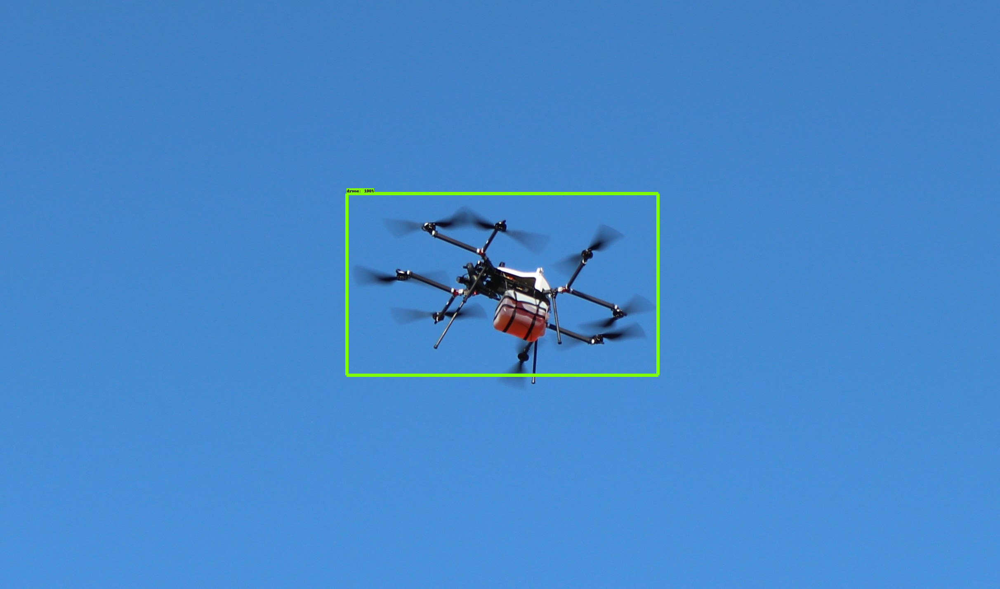

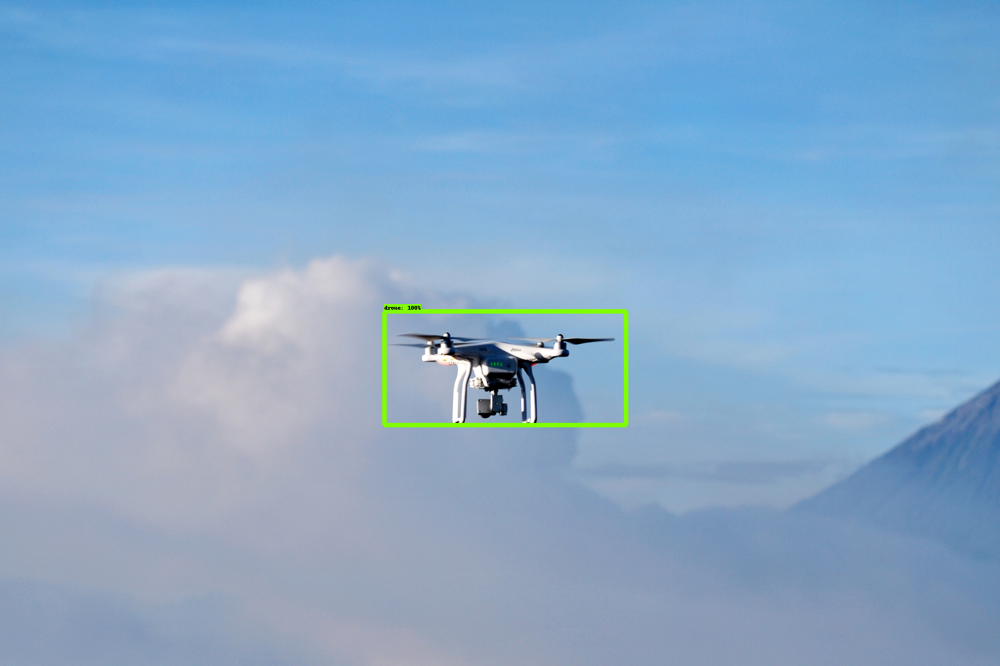

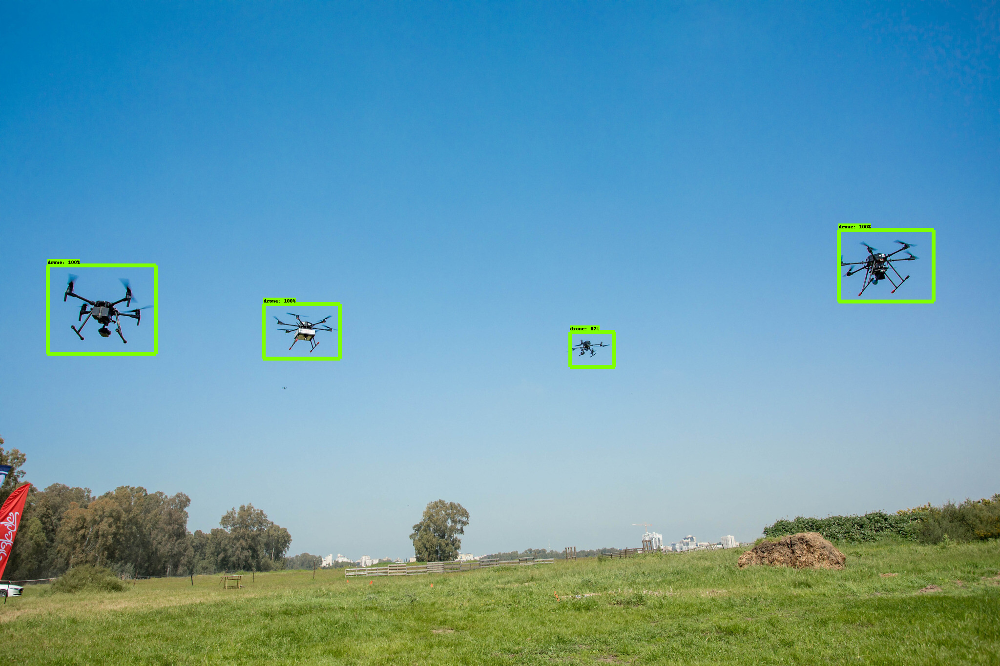

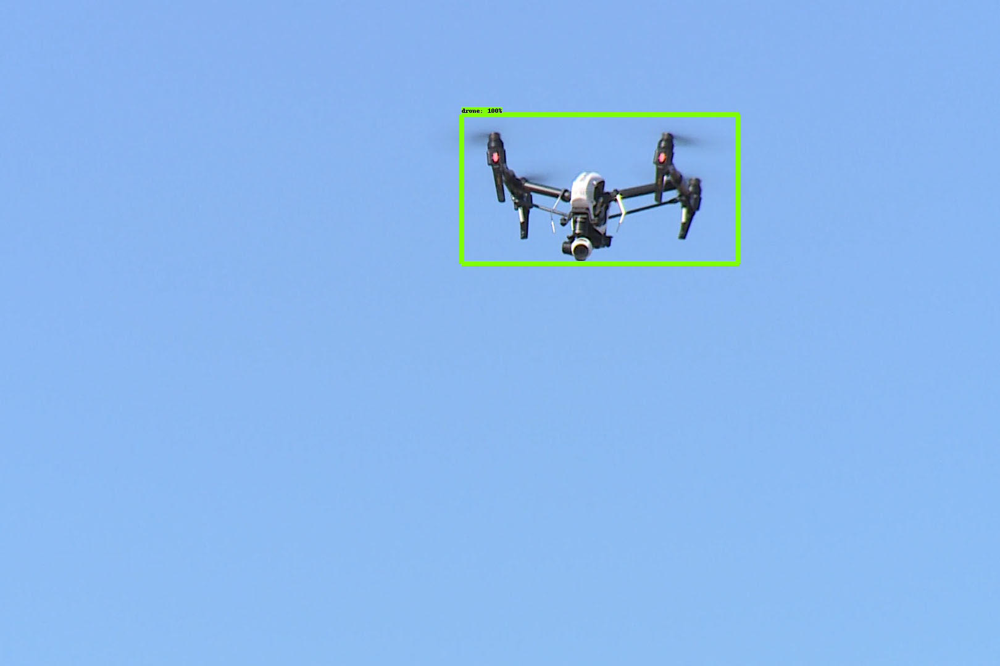

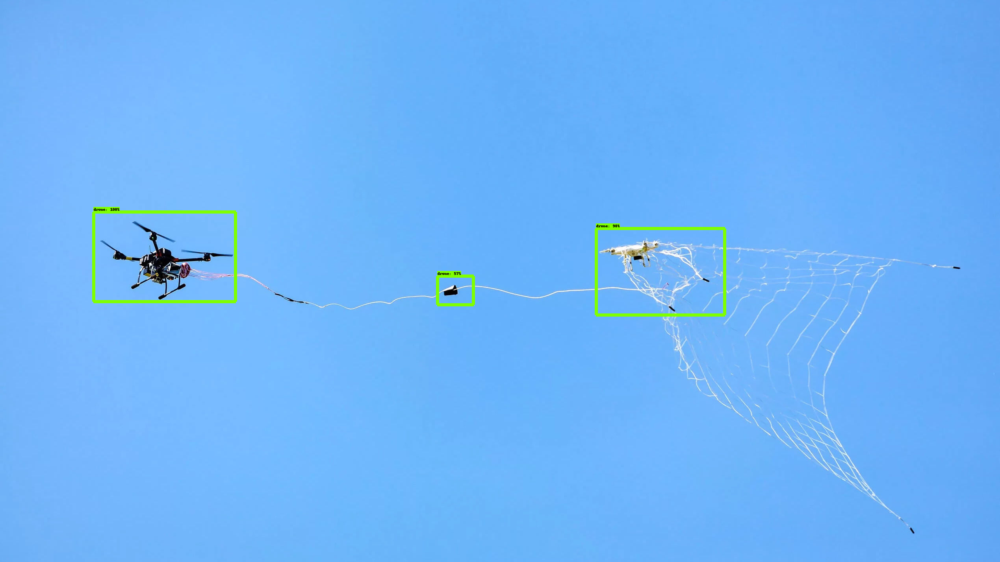

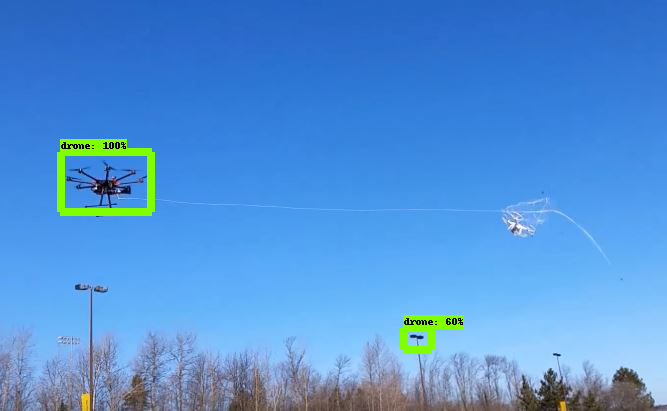

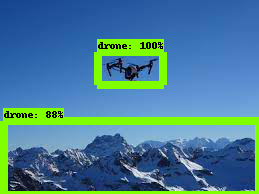

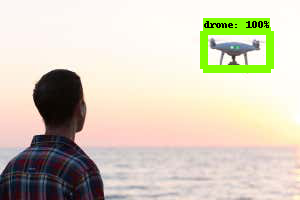

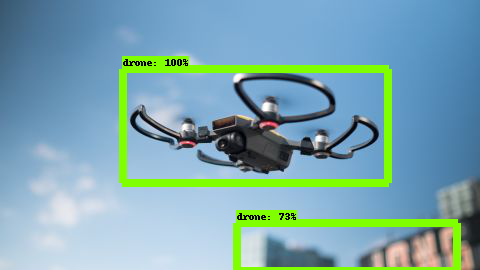

In [446]:
for image_path in TEST_IMAGE_PATHS:
  image_np = load_image_into_numpy_array(image_path)
  output_dict = run_inference_for_single_image(model, image_np)
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      min_score_thresh=0.5,
      line_thickness=8)
  display(Image.fromarray(image_np))

## 10 References

1. https://github.com/tensorflow/models/blob/master/research/object_detection/colab_tutorials/object_detection_tutorial.ipynb
2. https://neptune.ai/blog/how-to-train-your-own-object-detector-using-tensorflow-object-detection-api
3. https://neptune.ai/blog/tensorflow-object-detection-api-best-practices-to-training-evaluation-deployment